In [2]:
from time import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
from bbknn import bbknn
import scanorama as scnrma
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
import seaborn as sn

import warnings
warnings.filterwarnings("ignore")


from matplotlib.colors import ListedColormap
from sklearn.cluster import KMeans



sc.settings.verbosity = 3            # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.logging.print_memory_usage()
sc.set_figure_params(dpi=50, dpi_save=200)

scanpy==1.6.0 anndata==0.7.4 umap==0.3.10 numpy==1.17.2 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0
Memory usage: current 0.26 GB, difference +0.00 GB


In [3]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [4]:
def DE(adata, obs_id, obs_id_test, ref, pts_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='wilcoxon', pts=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])

    l231_genes['LF'] = lfcs

    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]

    return pd.Series(l231_genes['LF']).sort_values(ascending=False)

In [5]:
def compute_egt(adata, conds, obs_id):
    adata.X = adata.raw.X.A

    typeX_objs = []
    for cond in conds:
        typeX_objs.append(adata[adata.obs[obs_id]==cond].X)

    Egt = []
    thresh = []
    keep = []
    for gene in range(adata.shape[1]):

        Fgt = []
        Xgt = []

        for obj in typeX_objs:
            nonZ_cells = np.where(obj[:,gene]!=0)[0]
            Fgt.append(nonZ_cells.shape[0]/obj.shape[0])


            Xgt.append(np.mean(obj[nonZ_cells,gene]))


        Egt.append(np.array(Fgt)*np.array(Xgt))
        thresh.append((np.max(Egt[gene])-np.min(Egt[gene]))/np.max(Egt[gene]))

    adata.varm['Egt_cond'] = np.array(Egt)

    return adata    

In [6]:
def scatter(adata, x, genes, title, save_path,ylim):
    
    palette = sn.color_palette("Set2")

    plt.figure(figsize = (5.25,5))

    mod = adata
    csms_idxs = []
    #for i in list(set(mod.var_names).intersection(databases[0])):
    for i in genes:
        csms_idxs.append(mod.var.index.get_loc(i))

    for i in range(mod.shape[1]):

        if(i in csms_idxs):
            pass
        else:
            egt = (mod.varm['Egt_cond'][i])/np.max((mod.varm['Egt_cond'][i]))
            #egt = mod.varm['Egt'][i]

            sn.lineplot(x, egt, color='Silver')

    col = 0
    cols = ['b', 'g', 'r']

    for i in csms_idxs:        
        egt = (mod.varm['Egt_cond'][i])/np.max((mod.varm['Egt_cond'][i]))
        #egt = mod.varm['Egt'][i]


        sn.lineplot(x, egt, linewidth = 3,label=mod.var_names[i], 
                    color=palette[col])
        col = col+1

    #sn.lineplot(x, sp.stats.zscore((L23[:,'Cdh6'].varm['Egt'])[0]),  linewidth = 3,
    #           label='Cdh6', color=palette[col])

    plt.ylabel('Normalized Expression Level')
    #plt.title('Module 3 (' + str(mod.shape[1]) +  ' genes, ' + str(len(list(set(mod.var_names).intersection(databases[0])))) + ' CSMs)')

    plt.grid(False)
    #plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=1)
    plt.legend(prop={'style': 'italic'})
    plt.title(title)
    plt.ylim(ylim)
    plt.tight_layout()
    if (save_path is not None): plt.savefig(save_path)

# Read objs from conditions

In [178]:
#NR_h5ads = ['P21_glut_12012020.h5ad', 'P28_glut_12012020.h5ad', 'P38_glut_12012020.h5ad']
NR_h5ads = ['P28_glut_03222021.h5ad', 'P38_glut_12012020.h5ad']

NR_objs = []
for i in NR_h5ads:
    NR_objs.append(sc.read_h5ad(NR_path + i))

    
    
DR_h5ads = ['P28/P28_glut_dr_harmony_032921.h5ad', 'P38/P38_glut_dr_harmony_041221.h5ad']

DR_objs = []
for j in DR_h5ads:
    DR_objs.append(sc.read_h5ad(DR_path + j))

In [179]:
DL_objs = sc.read_h5ad('P28_glut_dl_harmony_022021.h5ad')

In [285]:
DL_L23_objs = DL_objs[DL_objs.obs.Type=='L2/3_1',:].concatenate(DL_objs[DL_objs.obs.Type=='L2/3_2',:],
                                                              DL_objs[DL_objs.obs.Type=='L2/3_3',:], 
                                                              batch_categories=['P28_DL L2/3 1', 'P28_DL L2/3 2', 
                                                                                'P28_DL L2/3 3'])

In [286]:
NR_L23_objs = []
for i in NR_objs:
    NR_L23_objs.append(i[i.obs.Type=='L2/3_A',:].concatenate(i[i.obs.Type=='L2/3_B',:], i[i.obs.Type=='L2/3_C',:], 
                                                            batch_categories=[i.obs.Age[0] +  '_NR ' + 'L2/3 A',
                                                                             i.obs.Age[0] +  '_NR ' + 'L2/3 B', 
                                                                             i.obs.Age[0] +  '_NR ' + 'L2/3 C']))

DR_L23_objs = []
for i in DR_objs:
    DR_L23_objs.append(i[i.obs.Type=='L2/3_1',:].concatenate(i[i.obs.Type=='L2/3_2',:], i[i.obs.Type=='L2/3_3',:], 
                                                            batch_categories=[i.obs['sample'][0][0:3] +  '_DR ' + 'L2/3 1',
                                                                             i.obs['sample'][0][0:3] +  '_DR ' + 'L2/3 2', 
                                                                             i.obs['sample'][0][0:3] +  '_DR ' + 'L2/3 3',]))

In [287]:
for i in NR_L23_objs:
    i.obs['AgeType'] = i.obs['batch']
    
for i in DR_L23_objs:
    i.obs['AgeType'] = i.obs['batch']

DL_L23_objs.obs['AgeType'] = DL_L23_objs.obs['batch']

In [288]:
L23_objs_all = NR_L23_objs + DR_L23_objs
L23_types_all = L23_objs_all[0].concatenate(L23_objs_all[1], L23_objs_all[2], 
                                           L23_objs_all[3], DL_L23_objs)

In [289]:
condition = []
for i in range(L23_types_all.shape[0]):
    condition.append(L23_types_all.obs.AgeType[i][0:6])

L23_types_all.obs['Condition'] = L23_types_all.obs['AgeType']
L23_types_all.obs['Condition'] = pd.Categorical(condition)

In [290]:
L23_types_all.obs.Condition

AACAAGACATGTCAGT-1-P28_1a-P28-P28_NR L2/3 A-0     P28_NR
AACTTCTAGGTCGAGT-1-P28_1a-P28-P28_NR L2/3 A-0     P28_NR
AAGCGTTAGTGAGTTA-1-P28_1a-P28-P28_NR L2/3 A-0     P28_NR
AATGGCTGTAGCTTAC-1-P28_1a-P28-P28_NR L2/3 A-0     P28_NR
ACACAGTCATTGACTG-1-P28_1a-P28-P28_NR L2/3 A-0     P28_NR
                                                   ...  
TTCACCGGTCGTGTTA-1-P28_dl_2b-4-P28_DL L2/3 3-4    P28_DL
TTGAACGGTGTCTTCC-1-P28_dl_2b-4-P28_DL L2/3 3-4    P28_DL
TTGATGGAGGCGAACT-1-P28_dl_2b-4-P28_DL L2/3 3-4    P28_DL
TCACGGGTCCATGAGT-1-P28_dl_1b-7-P28_DL L2/3 3-4    P28_DL
AGGGTGAAGACTCTTG-1-P28_dl_2b-7-P28_DL L2/3 3-4    P28_DL
Name: Condition, Length: 21269, dtype: category
Categories (5, object): ['P28_DL', 'P28_DR', 'P28_NR', 'P38_DR', 'P38_NR']

# Gradients of gene exp

In [291]:
L23_NR_P28 = L23_types_all[L23_types_all.obs.Condition=='P28_NR',:]

In [292]:
L23_DR_P28 = L23_types_all[L23_types_all.obs.Condition=='P28_DR',:]

In [293]:
L23_DL_P28 = L23_types_all[L23_types_all.obs.Condition=='P28_DL',:]

In [294]:
A = DE(adata=L23_NR_P28, obs_id='Type', obs_id_test='L2/3_A', ref='rest', pts_thresh=0.3)
C = DE(adata=L23_NR_P28, obs_id='Type', obs_id_test='L2/3_C', ref='rest',  pts_thresh=0.3)

ranking genes


Trying to set attribute `.obs` of view, copying.
... storing 'leiden' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cluster' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Class_broad' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'subclass' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample_new' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'layer' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'AgeType' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [295]:
B = DE(adata=L23_NR_P28, obs_id='Type', obs_id_test='L2/3_B', ref='rest',  pts_thresh=0.3)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [296]:
L23_NR_P28 = compute_egt(adata=L23_NR_P28, conds=['L2/3_A', 'L2/3_B', 'L2/3_C'], 
                        obs_id='Type')

In [297]:
L23_DR_P28 = compute_egt(adata=L23_DR_P28, conds=['L2/3_1', 'L2/3_2', 'L2/3_3'], 
                        obs_id='Type')

In [298]:
L23_DL_P28 = compute_egt(adata=L23_DL_P28, conds=['L2/3_1', 'L2/3_2', 'L2/3_3'], 
                        obs_id='Type')

## A

In [299]:
#funcs
from sklearn.cluster import KMeans


def clust_genes(X):
    wcss = []
    for i in range(1, 20):
        #print(i)
        kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
        kmeans.fit(X)
        wcss.append(kmeans.inertia_)
    plt.plot(range(1, 20), wcss)
    #plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()
def kmeans_and_plot_and_mod(adata, n_clusts):
    kmeans = KMeans(n_clusters=n_clusts, random_state=0).fit(sp.stats.zscore(adata.varm['Egt_cond'], axis=1))
    adata.var['KMeans_clust'] = pd.Series(np.array(kmeans.labels_, dtype=str), dtype='category').values

    for i in adata.var.KMeans_clust.values.categories:
        plt.bar( i, adata[:,adata.var.KMeans_clust==i].shape[1] )

       
    plt.show()
    #**This helps us find lowly expressed alpha genes to potentially remove**
    for i in adata.var.KMeans_clust.values.categories:
        #sc.pl.heatmap(adata, var_names= list(adata[:,adata.var.KMeans_clust==i].var_names), 
         #             groupby='Age',  swap_axes=True, standard_scale='var')
            
        sn.heatmap(sp.stats.zscore(adata[:,adata.var.KMeans_clust==i].varm['Egt_cond'], axis=1))
        plt.show()

    for i in adata.var.KMeans_clust.values.categories:
        plt.hist(np.array(np.mean(adata[:,adata.var.KMeans_clust==i].X, axis=0)), 
                 bins=10, label=i, histtype='step', linewidth=2,)

        #plt.show()
    plt.xlabel('Mean expression across all cells')
    plt.legend()
    
    adata_mods = []
    for i in adata.var.KMeans_clust.values.categories:
        adata_mods.append(list(adata[:,adata.var.KMeans_clust==i].var_names))
    
    return adata_mods

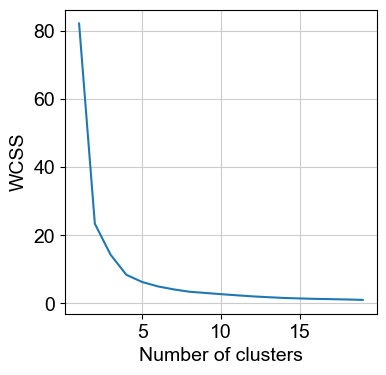

In [300]:
clust_genes(L23_NR_P28[:,A[A.values>1].index].varm['Egt_cond'])

Trying to set attribute `.var` of view, copying.


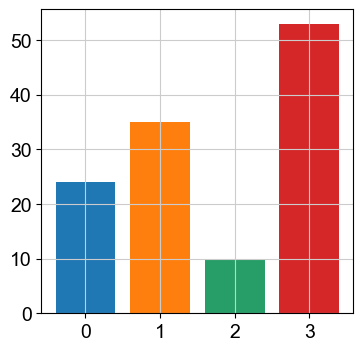

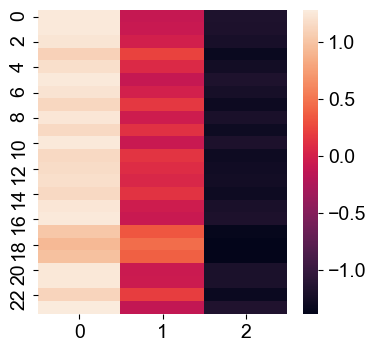

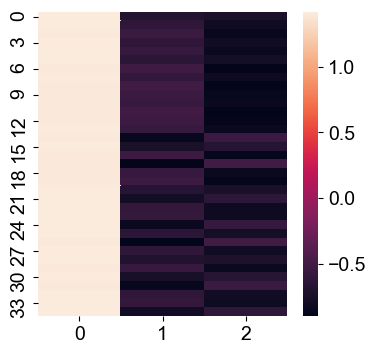

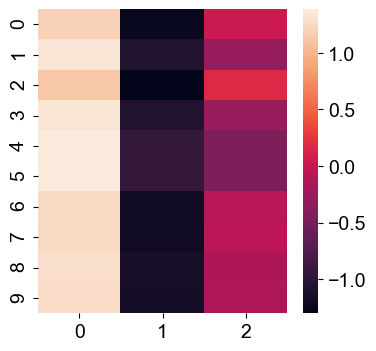

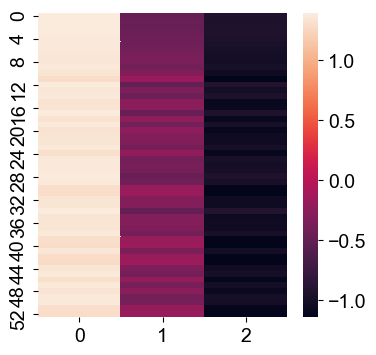

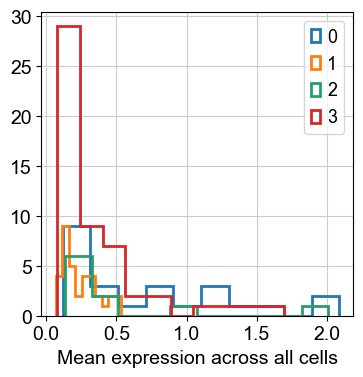

In [301]:
A_mods = kmeans_and_plot_and_mod(adata=L23_NR_P28[:,A[A.values>1].index], n_clusts=4)

In [89]:
'Grm1' in A_mods[0]

True

<AxesSubplot:>

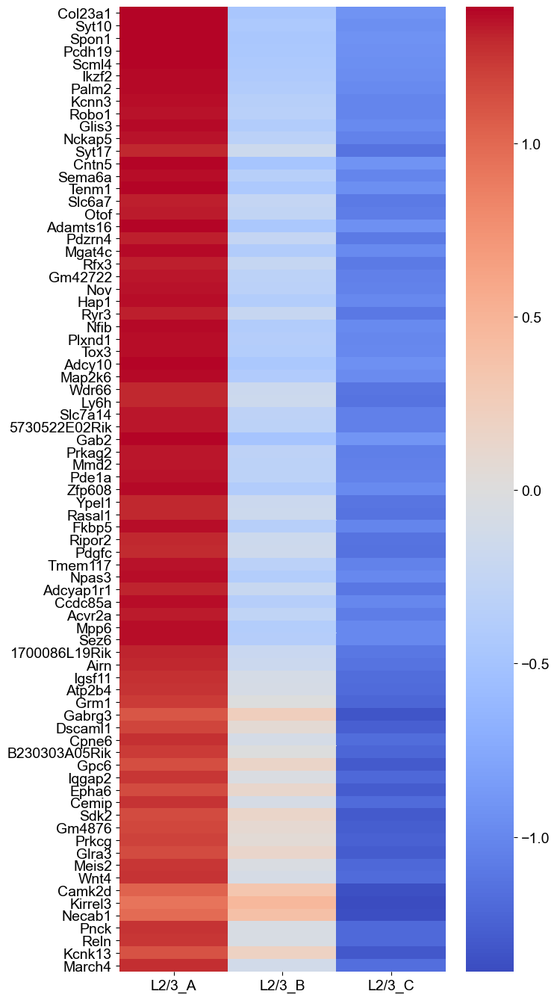

In [90]:
conds = ['L2/3_A', 'L2/3_B', 'L2/3_C']
hi = np.concatenate((L23_NR_P28[:, A_mods[3]].varm['Egt_cond'],
                       L23_NR_P28[:, A_mods[0]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)


plt.figure(figsize = (7,17))
sn.heatmap(zd, cmap='coolwarm',
           xticklabels=conds, 
           yticklabels=A_mods[3]+A_mods[0])

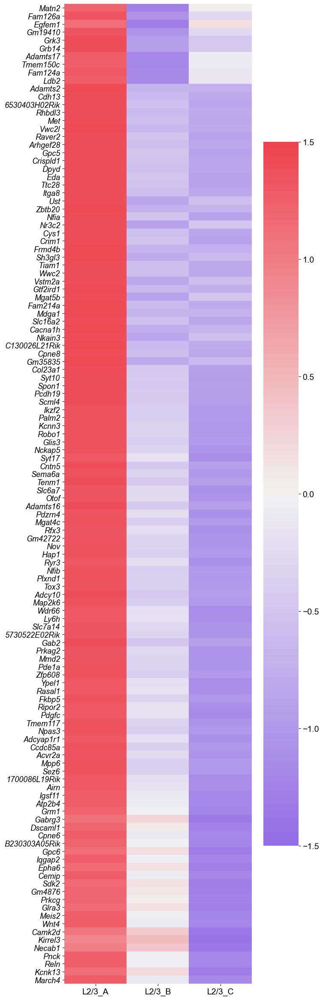

In [889]:

from matplotlib.colors import ListedColormap


mapcol = ListedColormap(sn.diverging_palette(275, 10, s=80, l=55, n=100).as_hex())
#mapcol = sn.color_palette("light:b", as_cmap=True)

conds = ['L2/3_A', 'L2/3_B', 'L2/3_C']
hi = np.concatenate((L23_NR_P28[:, A_mods[2]].varm['Egt_cond'], 
                     L23_NR_P28[:, A_mods[1]].varm['Egt_cond'], 
                     L23_NR_P28[:, A_mods[3]].varm['Egt_cond'],
                       L23_NR_P28[:, A_mods[0]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)


plt.figure(figsize = (7,30))
ax = sn.heatmap(zd, cmap=mapcol,
           xticklabels=conds, 
           yticklabels=A_mods[2]+A_mods[1]+A_mods[3]+A_mods[0],
               vmin=-1.5, vmax=1.5)
for label in ax.get_yticklabels():
    label.set_size(13)
    label.set_style("italic")
    
#plt.savefig('Grads/heatmap_A.pdf', dpi=200)

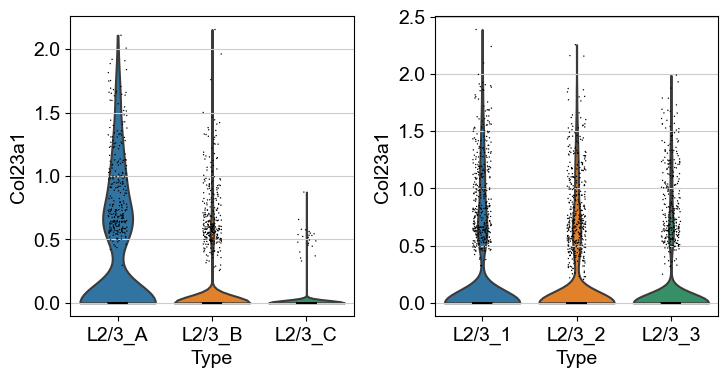

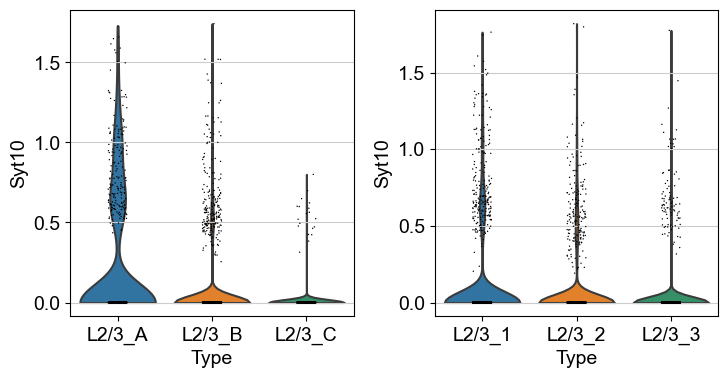

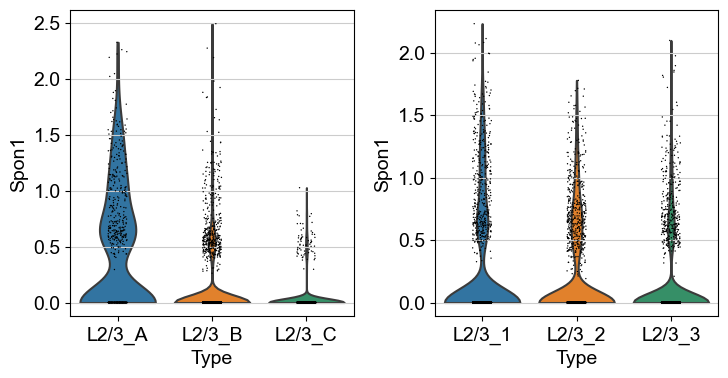

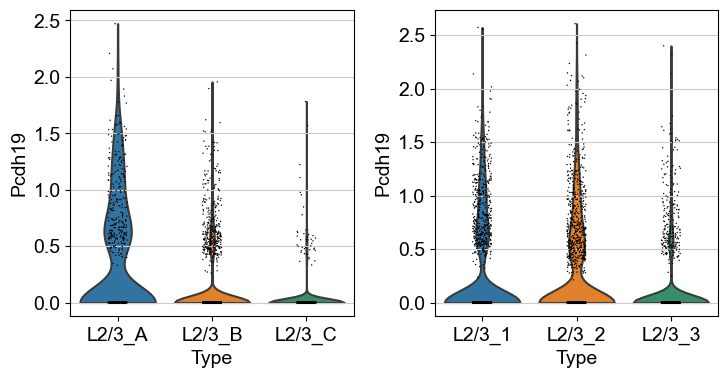

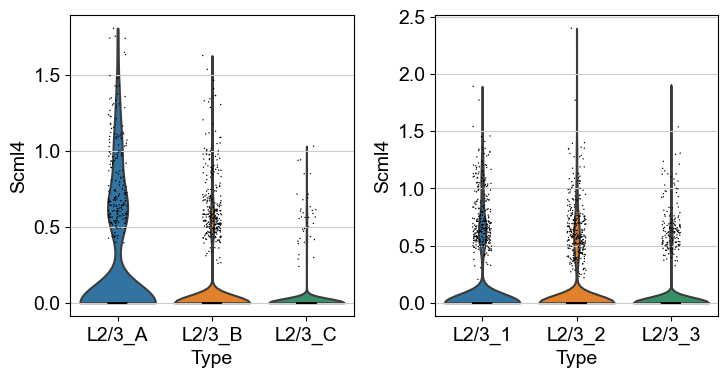

...

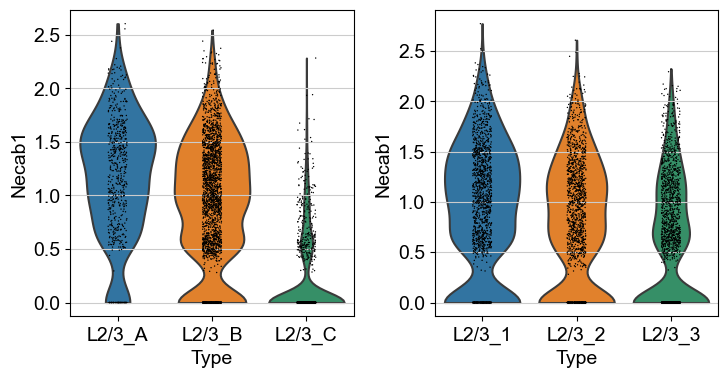

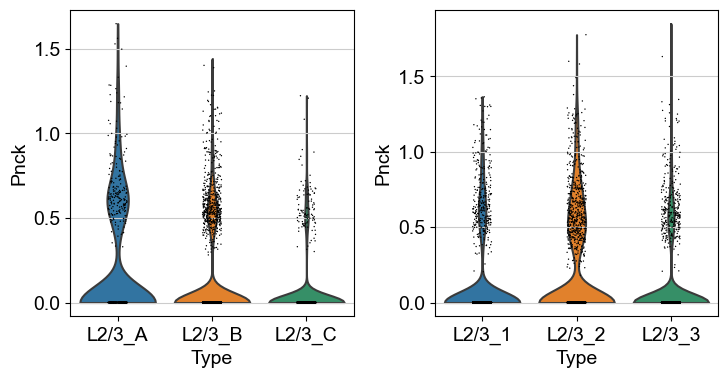

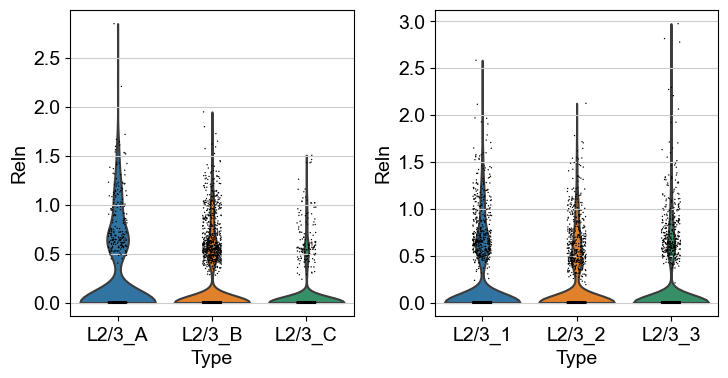

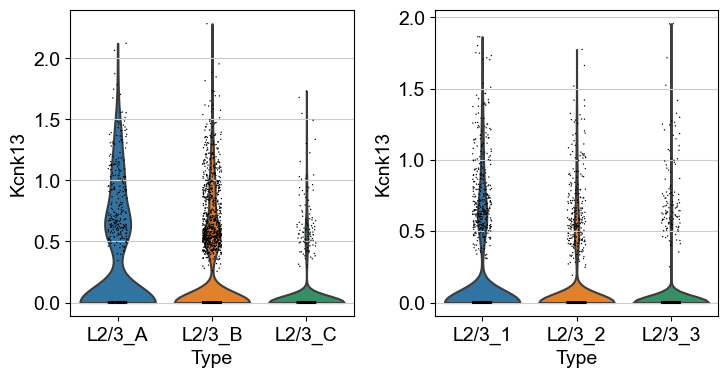

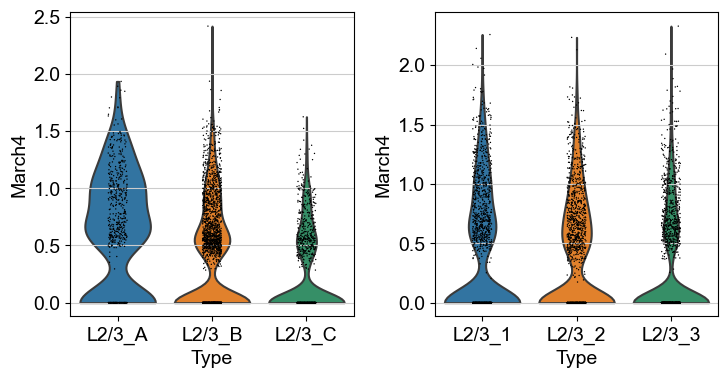

In [387]:
for i in A_mods[3]+A_mods[0]:
    fig, axs = plt.subplots(1,2, figsize=(7.5,4))
    sc.pl.violin(L23_NR_P28, i, groupby='Type', show=False, ax=axs[0])
    sc.pl.violin(L23_DR_P28, i, groupby='Type', show=False, ax=axs[1])

    plt.tight_layout()
    plt.show()

## B

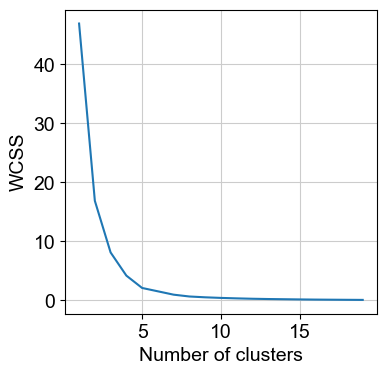

In [302]:
clust_genes(L23_NR_P28[:,B[B.values>1].index].varm['Egt_cond'])

Trying to set attribute `.var` of view, copying.


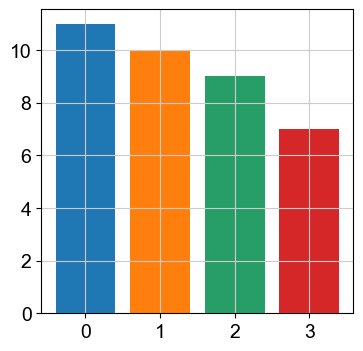

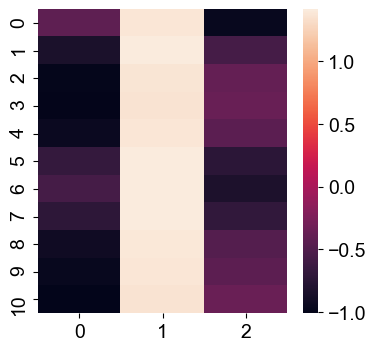

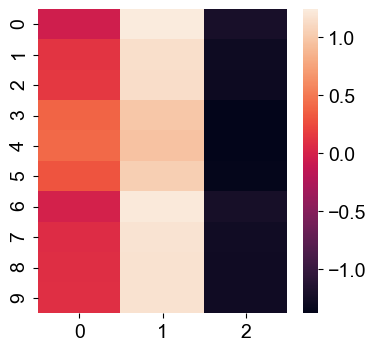

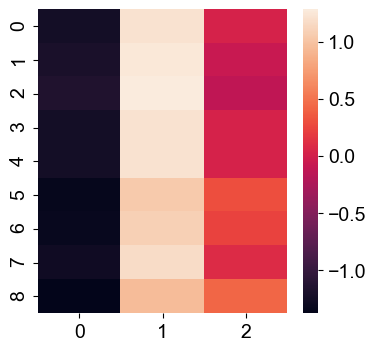

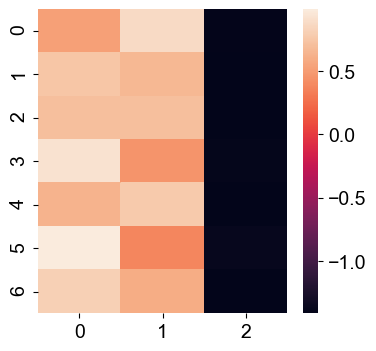

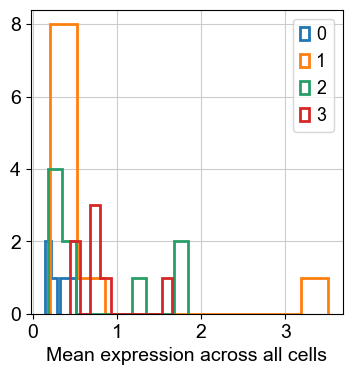

In [303]:
B_mods = kmeans_and_plot_and_mod(adata=L23_NR_P28[:,B[B.values>1].index], n_clusts=4)

In [304]:
B[B.values>1].shape

(37,)

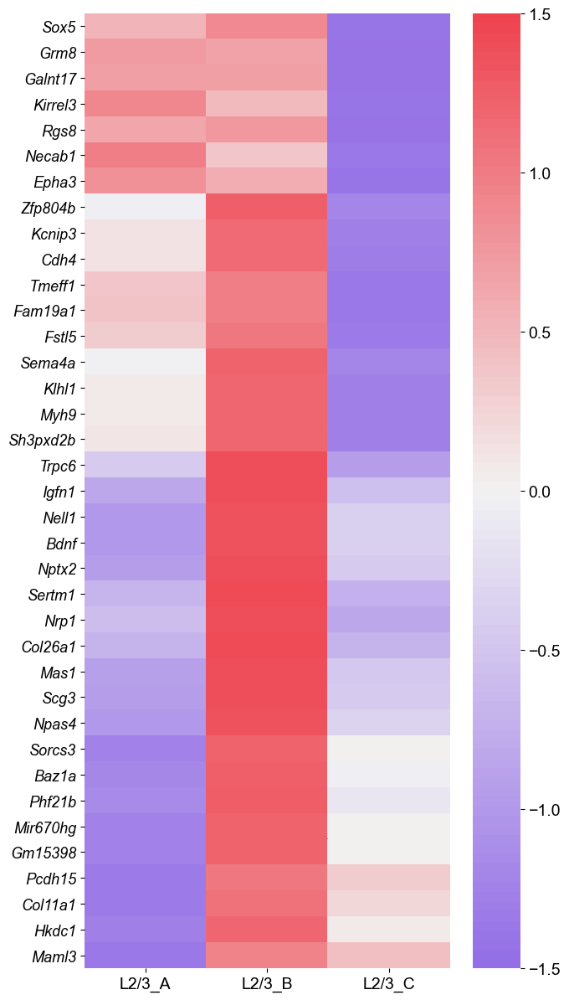

In [915]:
from matplotlib.colors import ListedColormap


mapcol = ListedColormap(sn.diverging_palette(275, 10, s=80, l=55, n=100).as_hex())
#mapcol = sn.color_palette("light:b", as_cmap=True)

conds = ['L2/3_A', 'L2/3_B', 'L2/3_C']
hi = np.concatenate((L23_NR_P28[:, B_mods[3]].varm['Egt_cond'], 
                     L23_NR_P28[:, B_mods[1]].varm['Egt_cond'], 
                     L23_NR_P28[:, B_mods[0]].varm['Egt_cond'],
                       L23_NR_P28[:, B_mods[2]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)


plt.figure(figsize = (7,15))
ax = sn.heatmap(zd, cmap=mapcol,
           xticklabels=conds, 
           yticklabels=B_mods[3]+B_mods[1]+B_mods[0]+B_mods[2],
               vmin=-1.5, vmax=1.5)
for label in ax.get_yticklabels():
    label.set_size(13)
    label.set_style("italic")
    
plt.savefig('Grads/heatmap_C.pdf', dpi=200)

## C

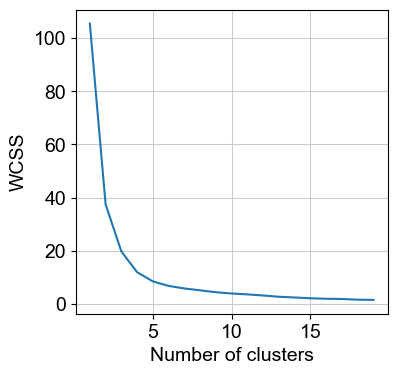

In [305]:
clust_genes(L23_NR_P28[:,C[C.values>1].index].varm['Egt_cond'])

Trying to set attribute `.var` of view, copying.


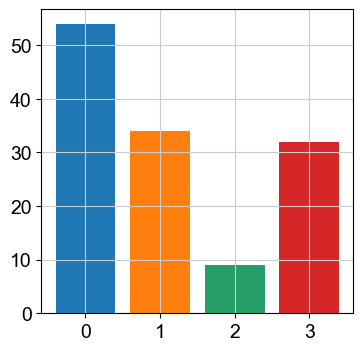

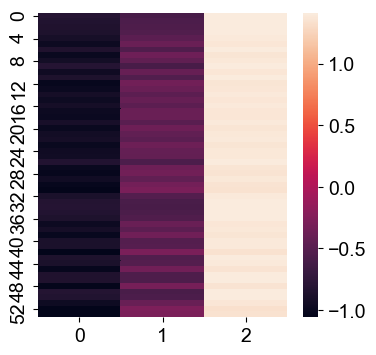

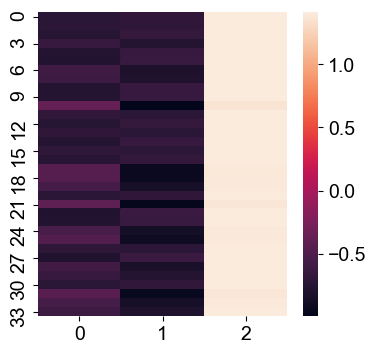

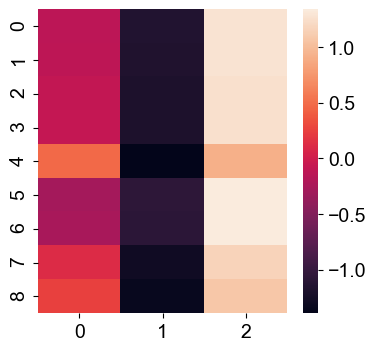

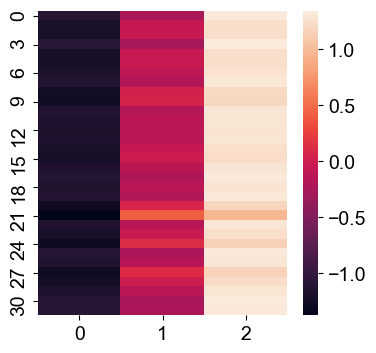

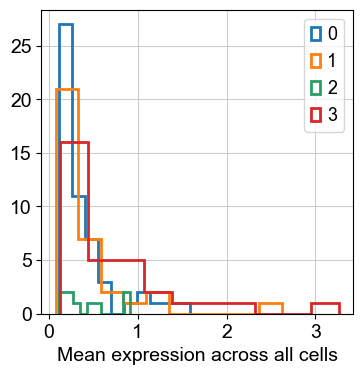

In [306]:
C_mods = kmeans_and_plot_and_mod(adata=L23_NR_P28[:,C[C.values>1].index], n_clusts=4)

In [307]:
hi = np.concatenate((L23_NR_P28[:, C_mods[0]].varm['Egt_cond'],
                       L23_NR_P28[:, C_mods[3]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)


plt.figure(figsize = (7,17))
sn.heatmap(zd, cmap='coolwarm',
           xticklabels=conds, 
           yticklabels=C_mods[0]+C_mods[3])

NameError: name 'conds' is not defined

<Figure size 350x850 with 0 Axes>

In [308]:
C_mods[3]

['Slc24a3',
 'Astn2',
 'Epha10',
 'Sema6d',
 'Scube1',
 'Ptchd4',
 'Pfkfb3',
 'Dlc1',
 'Cdh12',
 'Osbpl3',
 'Col25a1',
 'Adra1a',
 'Col5a1',
 'Cbln2',
 'Clmp',
 'Mei1',
 'Neu2',
 'Rcan2',
 'Olfm3',
 'Ntn4',
 'Igsf9b',
 'Etl4',
 'AI593442',
 'Kcnq5',
 'Cpne9',
 'Dennd4c',
 'Mkx',
 'Brinp3',
 'Ell2',
 'Gm21949',
 'Jdp2',
 '3632451O06Rik']

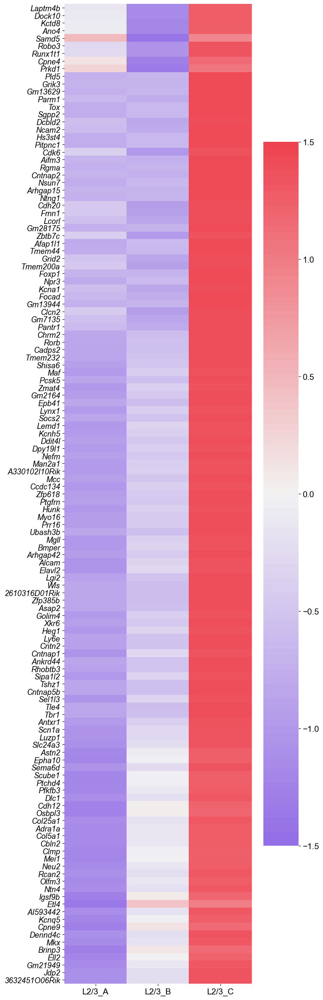

In [693]:
conds = ['L2/3_A', 'L2/3_B', 'L2/3_C']
hi = np.concatenate((L23_NR_P28[:, C_mods[2]].varm['Egt_cond'], 
                     L23_NR_P28[:, C_mods[1]].varm['Egt_cond'], 
                     L23_NR_P28[:, C_mods[0]].varm['Egt_cond'],
                       L23_NR_P28[:, C_mods[3]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)


plt.figure(figsize = (7,30))
ax = sn.heatmap(zd, cmap=mapcol,
           xticklabels=conds, 
           yticklabels=C_mods[2]+C_mods[1]+C_mods[0]+C_mods[3],
               vmin=-1.5, vmax=1.5)
for label in ax.get_yticklabels():
    label.set_size(13)
    label.set_style("italic")
    
plt.savefig('Grads/heatmap_C.pdf', dpi=200)

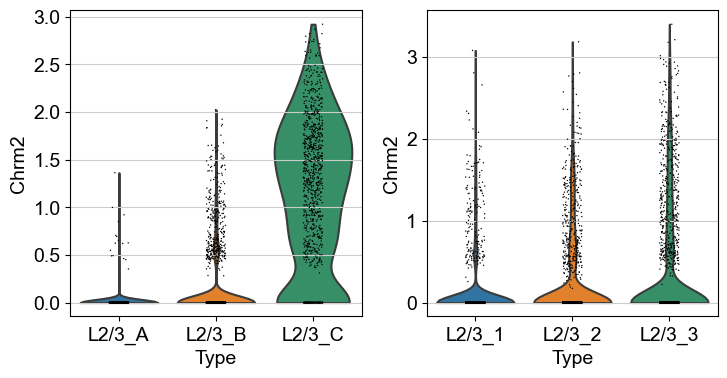

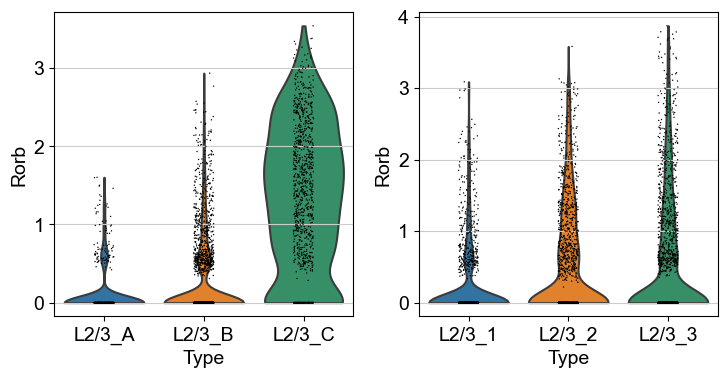

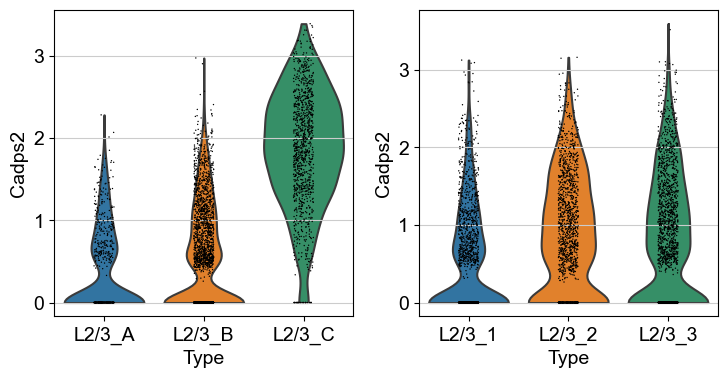

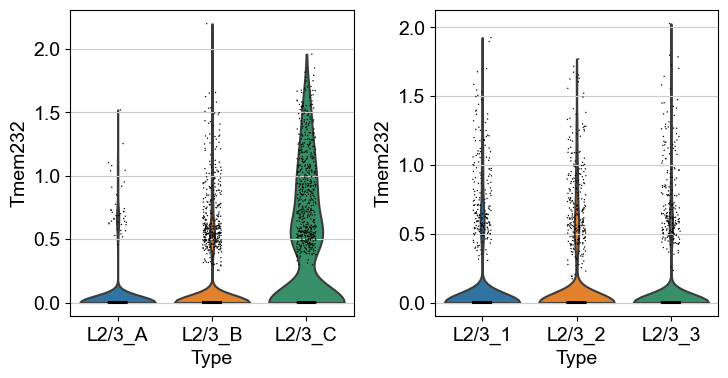

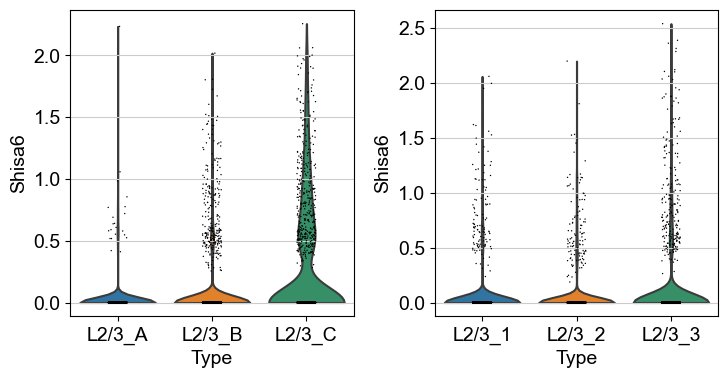

...

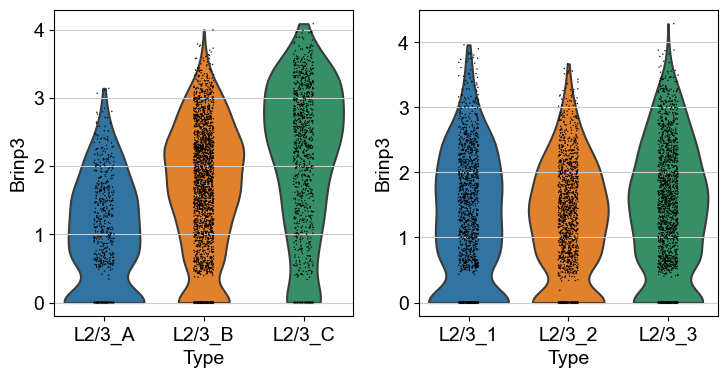

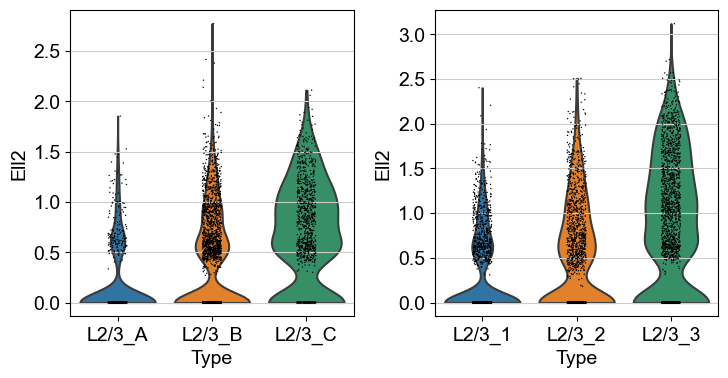

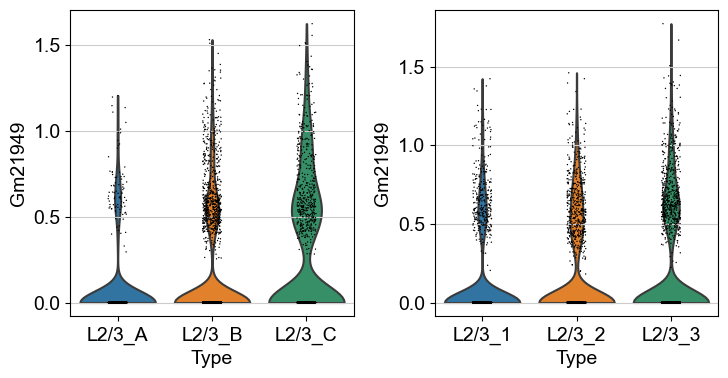

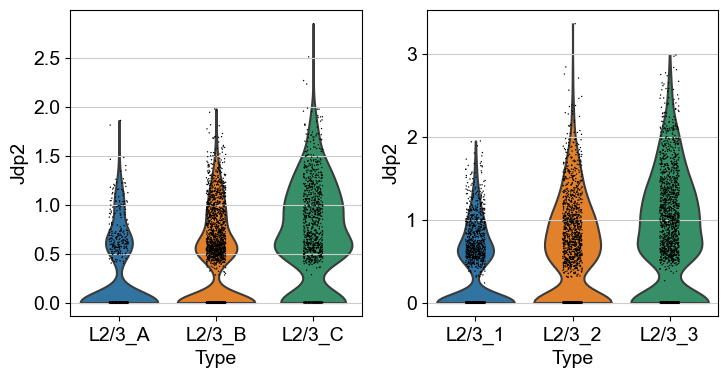

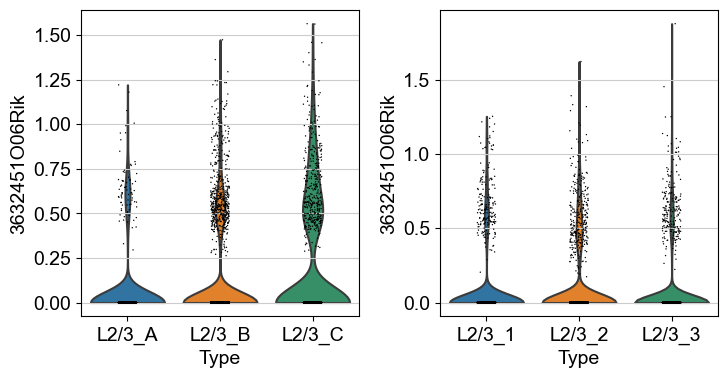

In [112]:
for i in C_mods[0]+C_mods[3]:
    fig, axs = plt.subplots(1,2, figsize=(7.5,4))
    sc.pl.violin(L23_NR_P28, i, groupby='Type', show=False, ax=axs[0])
    sc.pl.violin(L23_DR_P28, i, groupby='Type', show=False, ax=axs[1])

    plt.tight_layout()
    plt.show()

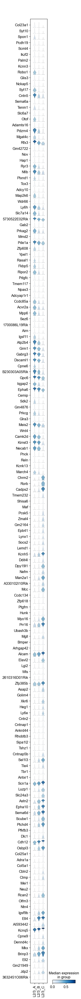

In [673]:
sc.pl.stacked_violin(L23_NR_P28, var_names = A_mods[3]+A_mods[0]+C_mods[0]+C_mods[3], 
                     groupby='Type', swap_axes=True, standard_scale='var', save='ABCandCBA.pdf')

## ABC heatmap in NR/DR/DL


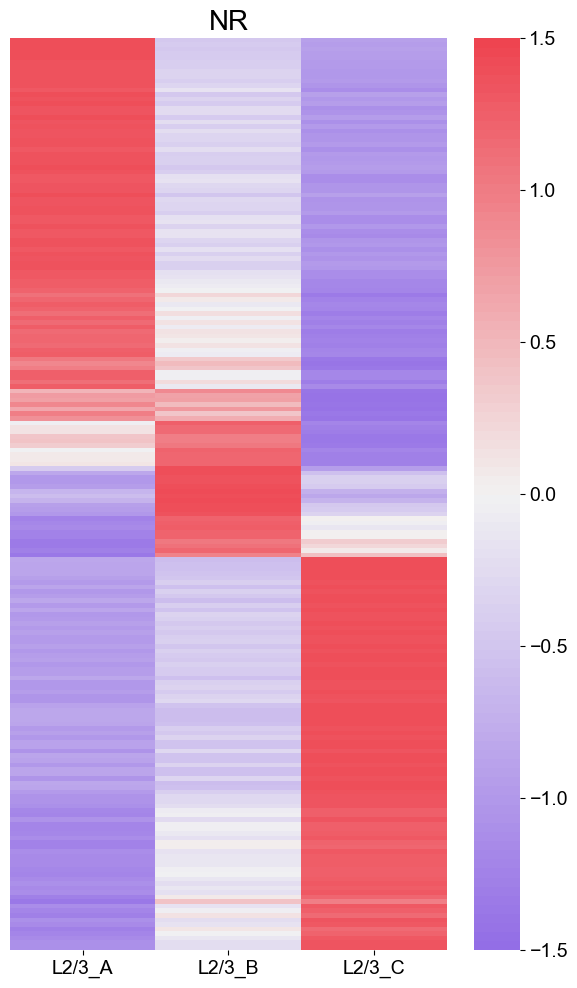

In [97]:

from matplotlib.colors import ListedColormap


mapcol = ListedColormap(sn.diverging_palette(275, 10, s=80, l=55, n=100).as_hex())
#mapcol = sn.color_palette("light:b", as_cmap=True)

conds = ['L2/3_A', 'L2/3_B', 'L2/3_C']
hi = np.concatenate((L23_NR_P28[:, A_mods[3]].varm['Egt_cond'],
                       L23_NR_P28[:, A_mods[0]].varm['Egt_cond'], 
                     L23_NR_P28[:, B_mods[3]].varm['Egt_cond'], 
                     L23_NR_P28[:, B_mods[1]].varm['Egt_cond'], 
                     L23_NR_P28[:, B_mods[0]].varm['Egt_cond'],
                       L23_NR_P28[:, B_mods[2]].varm['Egt_cond'],
                     L23_NR_P28[:, C_mods[0]].varm['Egt_cond'],
                       L23_NR_P28[:, C_mods[3]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)



plt.figure(figsize = (7,12))
ax = sn.heatmap(zd, cmap=mapcol,
           xticklabels=conds,yticklabels=False,
               vmin=-1.5, vmax=1.5)

plt.title('NR', fontsize=20)   
plt.savefig('Grads/heatmap_mainA.pdf', dpi=200)

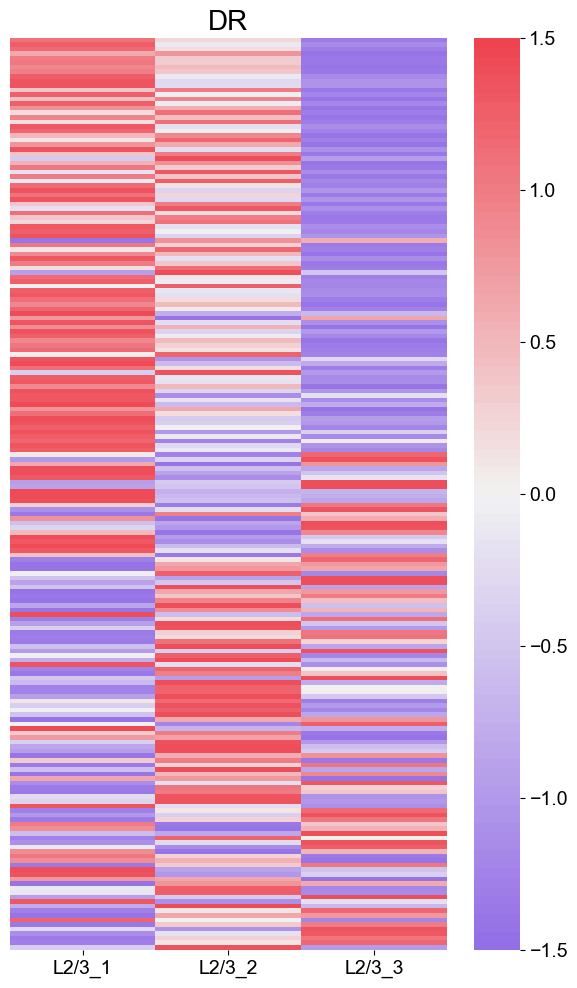

In [98]:

from matplotlib.colors import ListedColormap


mapcol = ListedColormap(sn.diverging_palette(275, 10, s=80, l=55, n=100).as_hex())
#mapcol = sn.color_palette("light:b", as_cmap=True)

conds = ['L2/3_1', 'L2/3_2', 'L2/3_3']
hi = np.concatenate((L23_DR_P28[:, A_mods[3]].varm['Egt_cond'],
                       L23_DR_P28[:, A_mods[0]].varm['Egt_cond'], 
                     L23_DR_P28[:, B_mods[3]].varm['Egt_cond'], 
                     L23_DR_P28[:, B_mods[1]].varm['Egt_cond'], 
                     L23_DR_P28[:, B_mods[0]].varm['Egt_cond'],
                       L23_DR_P28[:, B_mods[2]].varm['Egt_cond'],
                     L23_DR_P28[:, C_mods[0]].varm['Egt_cond'],
                       L23_DR_P28[:, C_mods[3]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)



plt.figure(figsize = (7,12))
ax = sn.heatmap(zd, cmap=mapcol,
           xticklabels=conds,yticklabels=False,
               vmin=-1.5, vmax=1.5)

plt.title('DR', fontsize=20)   
plt.savefig('Grads/heatmap_mainB.pdf', dpi=200)

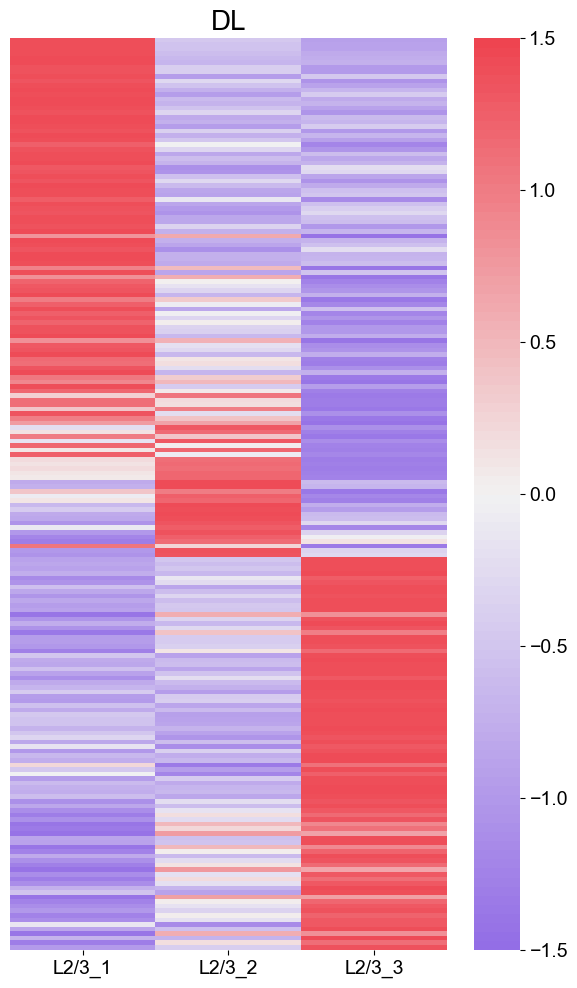

In [99]:

from matplotlib.colors import ListedColormap


mapcol = ListedColormap(sn.diverging_palette(275, 10, s=80, l=55, n=100).as_hex())
#mapcol = sn.color_palette("light:b", as_cmap=True)

conds = ['L2/3_1', 'L2/3_2', 'L2/3_3']
hi = np.concatenate((L23_DL_P28[:, A_mods[3]].varm['Egt_cond'],
                       L23_DL_P28[:, A_mods[0]].varm['Egt_cond'], 
                     L23_DL_P28[:, B_mods[3]].varm['Egt_cond'], 
                     L23_DL_P28[:, B_mods[1]].varm['Egt_cond'], 
                     L23_DL_P28[:, B_mods[0]].varm['Egt_cond'],
                       L23_DL_P28[:, B_mods[2]].varm['Egt_cond'],
                     L23_DL_P28[:, C_mods[0]].varm['Egt_cond'],
                       L23_DL_P28[:, C_mods[3]].varm['Egt_cond'],), axis=0)

zd = sp.stats.zscore(hi, axis=1)



plt.figure(figsize = (7,12))
ax = sn.heatmap(zd, cmap=mapcol,
           xticklabels=conds,yticklabels=False,
               vmin=-1.5, vmax=1.5)

plt.title('DL', fontsize=20)   
plt.savefig('Grads/heatmap_mainC.pdf', dpi=200)

## In NR vs DR

In [309]:
DR = DE(adata=L23_types_all, obs_id='Condition', obs_id_test='P28_DR', ref='P28_NR', pts_thresh=0.3)
NR = DE(adata=L23_types_all, obs_id='Condition', obs_id_test='P28_NR', ref='P28_DR', pts_thresh=0.3)

ranking genes


... storing 'leiden' as categorical
... storing 'cluster' as categorical
... storing 'Class_broad' as categorical
... storing 'sample' as categorical
... storing 'Age' as categorical
... storing 'subclass' as categorical
... storing 'sample_new' as categorical
... storing 'layer' as categorical
... storing 'Type' as categorical
... storing 'AgeType' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


ABC genes

In [310]:
in_ = 0

for i in A_mods[3]+A_mods[0]:

    if(i in DR[DR>1].index): in_= in_+1
print(in_, 'out of', len(A_mods[3]+A_mods[0]), 'up in DR', len(DR[DR>1]))

in_ = 0

for i in A_mods[3]+A_mods[0]:

    if(i in NR[NR>1].index): in_= in_+1
print(in_, 'out of', len(A_mods[3]+A_mods[0]), 'up in NR', len(NR[NR>1]))

5 out of 77 up in DR 178
0 out of 77 up in NR 55


In [312]:
L23_NRDR = L23_types_all[L23_types_all.obs.Condition!='P28_DL',:]

In [318]:
from matplotlib.colors import ListedColormap
mapcol = ListedColormap(sn.color_palette('light:#a31fe7', n_colors=100).as_hex())


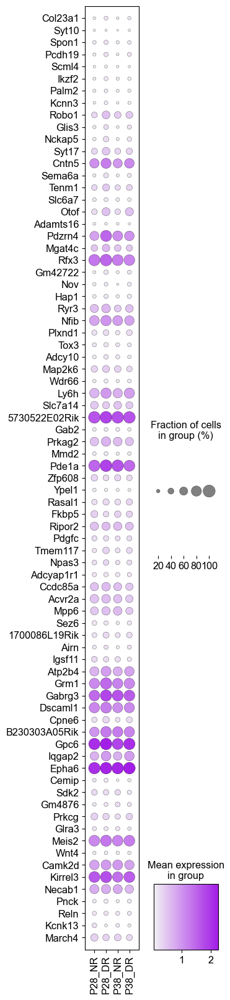

In [340]:
sc.pl.dotplot(L23_NRDR, A_mods[3]+A_mods[0], groupby='Condition', swap_axes=True,
             categories_order=['P28_NR', 'P28_DR', 'P38_NR', 'P38_DR'], cmap=mapcol,
             figsize=(2.75,20), save='ABCgrad_genes_in_DR.pdf')

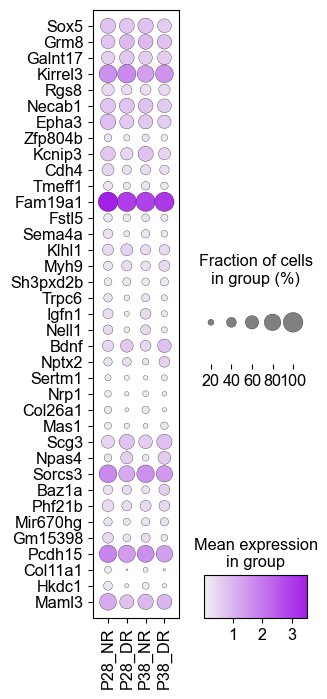

In [339]:
sc.pl.dotplot(L23_NRDR, B_mods[3]+B_mods[1]+B_mods[0]+B_mods[2], groupby='Condition', swap_axes=True,
             categories_order=['P28_NR', 'P28_DR', 'P38_NR', 'P38_DR'], cmap=mapcol,
             figsize=(2.75,8), save='Bgrad_genes_in_DR.pdf')


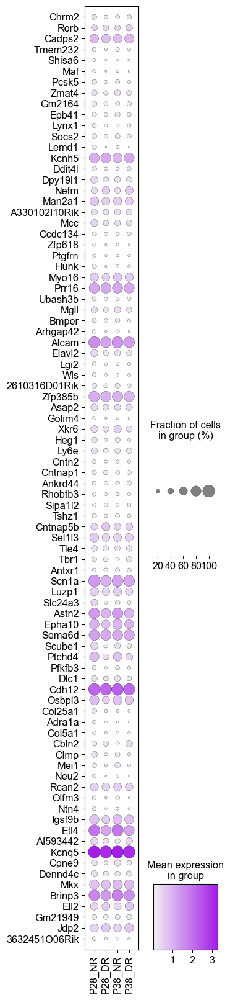

In [342]:
sc.pl.dotplot(L23_NRDR, C_mods[0]+C_mods[3], groupby='Condition', swap_axes=True,
             categories_order=['P28_NR', 'P28_DR', 'P38_NR', 'P38_DR'], cmap=mapcol,
             figsize=(2.75,20), save='CBAgrad_genes_in_DR.pdf')


B genes

In [925]:
in_ = 0

for i in B_mods[3]+B_mods[1]+B_mods[0]+B_mods[2]:

    if(i in DR[DR>1].index): in_= in_+1
print(in_, 'out of', len(B_mods[3]+B_mods[1]+B_mods[0]+B_mods[2]), 'up in DR', len(DR[DR>1]))

in_ = 0

for i in B_mods[3]+B_mods[1]+B_mods[0]+B_mods[2]:

    if(i in NR[NR>1].index): in_= in_+1
print(in_, 'out of', len(B_mods[3]+B_mods[1]+B_mods[0]+B_mods[2]), 'up in NR', len(NR[NR>1]))

1 out of 37 up in DR 178
6 out of 37 up in NR 55


CBA genes

In [554]:
in_ = 0

for i in C_mods[0]+C_mods[3]:

    if(i in DR[DR>1].index): in_= in_+1
print(in_, 'out of', len(C_mods[0]+C_mods[3]), 'up in DR', len(DR[DR>1]))

in_ = 0

for i in C_mods[0]+C_mods[3]:

    if(i in NR[NR>1].index): in_= in_+1
print(in_, 'out of', len(C_mods[0]+C_mods[3]), 'up in NR', len(NR[NR>1]))

1 out of 86 up in DR 178
6 out of 86 up in NR 55


In [559]:
len(set(IEGs).intersection(DR[DR>1].index))

57

In [560]:
len(set(IEGs).intersection(NR[NR>1].index))

3

In [711]:
cols = sn.color_palette('pastel').as_hex() + sn.color_palette('Set2').as_hex()[0:5]

[(0.6313725490196078, 0.788235294117647, 0.9568627450980393),
 (1.0, 0.7058823529411765, 0.5098039215686274),
 (0.5529411764705883, 0.8980392156862745, 0.6313725490196078),
 (1.0, 0.6235294117647059, 0.6078431372549019),
 (0.8156862745098039, 0.7333333333333333, 1.0),
 (0.8705882352941177, 0.7333333333333333, 0.6078431372549019),
 (0.9803921568627451, 0.6901960784313725, 0.8941176470588236),
 (0.8117647058823529, 0.8117647058823529, 0.8117647058823529),
 (1.0, 0.996078431372549, 0.6392156862745098),
 (0.7254901960784313, 0.9490196078431372, 0.9411764705882353)]

In [ ]:
mapcol = ListedColormap(sns.color_palette(colors[i], n_colors=100).as_hex())

In [716]:
ListedColormap(sn.color_palette('pastel').as_hex())

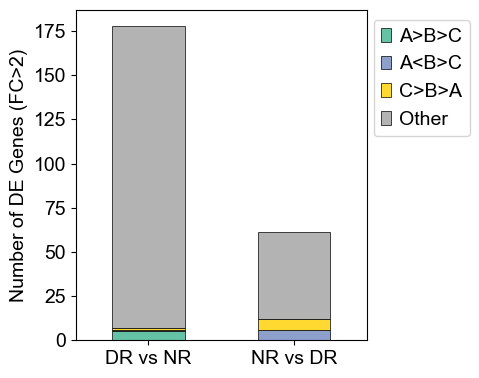

In [928]:
bar2 = pd.DataFrame({'DR vs NR': [5,1,1,171], 'NR vs DR': [0,6,6,49]}, index=['A>B>C', 'A<B>C' , 'C>B>A', 'Other']).transpose()

bar2.plot(
    kind = 'bar',
    stacked = True,
    mark_right = True,
    grid=False, linewidth=0.5, width=0.5,figsize=(5,4), edgecolor='black',colormap=ListedColormap(sn.color_palette('Set2').as_hex()))
plt.ylabel('Number of DE Genes (FC>2)')
plt.legend(bbox_to_anchor=(0.99, 1), loc='upper left', fontsize=14, ncol=1)
plt.xticks(rotation='0')
plt.tight_layout()
plt.savefig('Grads/Barplot_2.pdf', dpi=200)
plt.show()

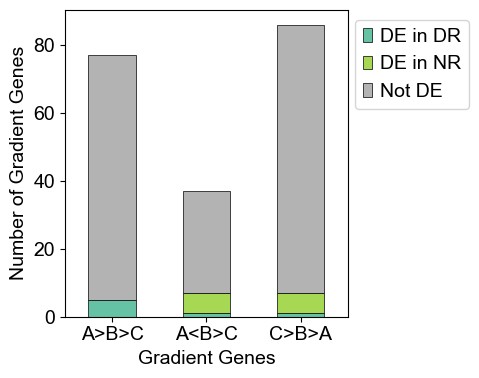

In [3]:
bar1 = pd.DataFrame({'A>B>C': [5,0,72], 'A<B>C': [1,6,30],  'C>B>A': [1,6,79]}, index=['DE in DR', 'DE in NR', 'Not DE']).transpose()

bar1.plot(
    kind = 'bar',
    stacked = True,
    mark_right = True,
    grid=False, linewidth=0.5, width=0.5,figsize=(5,4), edgecolor='black', colormap=ListedColormap(sn.color_palette('Set2').as_hex()))
plt.ylabel('Number of Gradient Genes')
plt.legend(bbox_to_anchor=(0.99, 1), loc='upper left', fontsize=14, ncol=1)
plt.xticks(rotation='0')
plt.xlabel('Gradient Genes')
plt.tight_layout()
plt.savefig('Grads/Barplot.pdf', dpi=200)
plt.show()

# Pseudotime

In [7]:


P8_glut = sc.read_h5ad(path_to_h5ads + 'P8_glut_02112021.h5ad')
P14_glut = sc.read_h5ad(path_to_h5ads + 'P14_glut_02112021.h5ad')
P17_glut = sc.read_h5ad(path_to_h5ads + 'P17_glut_12022020.h5ad')
P21_glut = sc.read_h5ad(path_to_h5ads + 'P21_glut_12012020.h5ad')
P28_glut = sc.read_h5ad(path_to_h5ads + 'P28_glut_03222021.h5ad')
P38_glut = sc.read_h5ad(path_to_h5ads + 'P38_glut_12012020.h5ad')

In [8]:
sc.pp.neighbors(P8_glut, n_neighbors=25, use_rep='X_harmony')
sc.pp.neighbors(P14_glut, n_neighbors=25, use_rep='X_harmony')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)


In [517]:
P8 = P8_glut[P8_glut.obs.Subclass=='L2/3',:]
P14 = P14_glut[P14_glut.obs.Subclass=='L2/3',:]
P17 = P17_glut[P17_glut.obs.Subclass=='L2/3',:]
P21 = P21_glut[P21_glut.obs.Subclass=='L2/3',:]
P28 = P28_glut[P28_glut.obs.Subclass=='L2/3',:]
P38 = P38_glut[P38_glut.obs.Subclass=='L2/3',:]

In [186]:
DR_objs[0][DR_objs[0].obs.Subclass=='L2/3',:]

View of AnnData object with n_obs × n_vars = 4704 × 20350
    obs: 'n_genes', 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'sample', 'layer', 'cluster', 'Type', 'Subclass'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Subclass_colors', 'Type_colors', "dendrogram_['Type']", "dendrogram_['leiden']", 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
DL_objs

## PX

In [625]:
P8 = P28.copy()
#P8 = DR[DR_objs[0].obs.Subclass=='L2/3',:]

In [602]:
P8 = P8[P8.obs_names!=P8.obs_names[4702],:] #for P28DR
#P8 = P8[P8.obs_names!=P8.obs_names[3064],:] #for P38DR

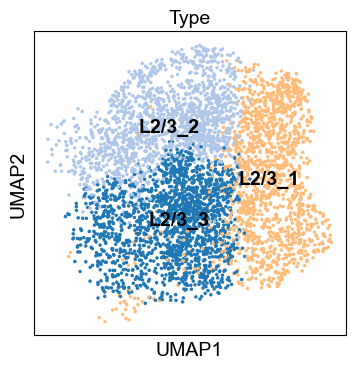

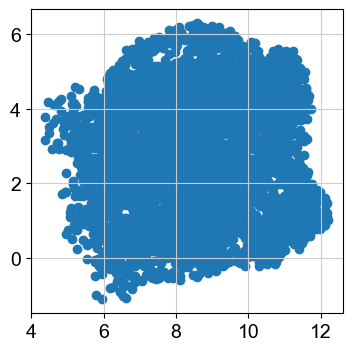

In [603]:
sc.pl.umap(P8, color='Type', legend_loc='on data')
plt.scatter(P8.obsm['X_umap'][:,0], P8.obsm['X_umap'][:,1])

In [612]:
biggerthan6 = np.where(P8.obsm['X_umap'][:,0]>11.6)[0]

biggerthan11 = np.where(P8.obsm['X_umap'][:,1]>2.2)[0]

set(biggerthan6).intersection(biggerthan11)

{76, 135, 227, 574, 639, 837, 1081, 1269, 1867, 2115}

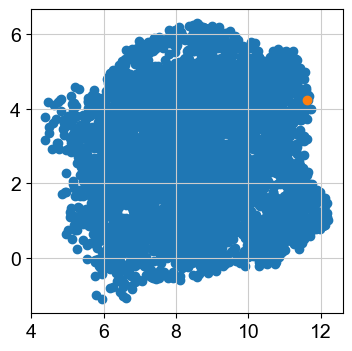

In [613]:
plt.scatter(P8.obsm['X_umap'][:,0], P8.obsm['X_umap'][:,1])
plt.scatter(P8.obsm['X_umap'][639,0], P8.obsm['X_umap'][1081,1])

**Roots**

P8: 1829

P14: 671

P17: 1841

P21: 1231

P28: 1103

P38: 1967

P28DL: 3071

P28DR: 144

P38DR: 3860

In [626]:
P8.uns['iroot'] = 1103
sc.tl.diffmap(P8, n_comps=10)
sc.tl.dpt(P8,)

computing Diffusion Maps using n_comps=10(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.97573715 0.9569393  0.91289335 0.90595454 0.8956817
     0.88185316 0.86875665 0.8582468  0.8531193 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


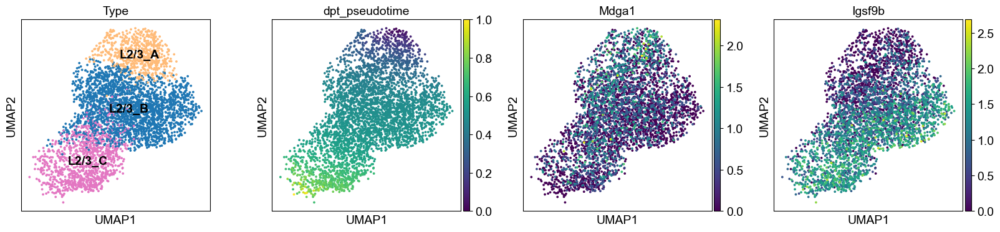

In [627]:
sc.pl.umap(P8, color=['Type', 'dpt_pseudotime', 'Mdga1', 'Igsf9b'], legend_loc='on data')

B/c the plots are super noisy, need to subsample cells. But don't subsample everything. Use all the non-zero cells and add in a subsampling of the 0 cells.

Then tune the interval below

In [616]:
P8_copy = P8.copy()

#sc.pp.subsample(P8_copy, fraction=0.25)

reordered_IDs = P8_copy.obs.sort_values('dpt_pseudotime').index

P8_re = P8[reordered_IDs,:]

X_re = P8_re.raw.X.A
X_re.shape

(4703, 20350)

9
9


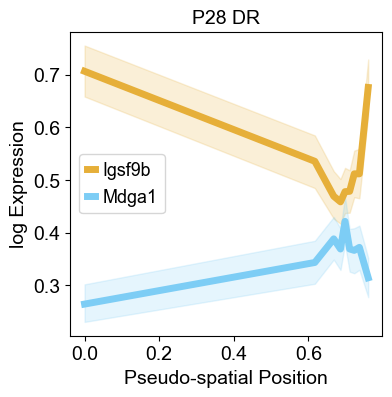

In [624]:
#with interval averaging
cols = ['#e6af39','#7DCDF5', 'r', 'b']
c = 0
spears = []
for gene in ['Igsf9b', 'Mdga1']:
    nonZ = np.where(X_re[:,P8_re.var_names.get_loc(gene)]>0)[0]
    
    #x = P8_re.obs['dpt_pseudotime'][nonZ].values
    #y = X_re[:,P8_re.var_names.get_loc(gene)][nonZ]
    
    x = P8_re.obs['dpt_pseudotime'].values
    y = X_re[:,P8_re.var_names.get_loc(gene)]

    interval = 500

    a = 0
    b = interval

    time = []
    exp = []
    
    time_df = []
    exp_df = []
    for i in range(int(np.round(len(x)/b,0))):
        t = np.mean(x[a:b])
        t = x[a]
        e = np.mean(y[a:b])
        
        time.append(t)
        exp.append(e)
        
        time_df = time_df + [t]*len(x[a:b])
        exp_df = exp_df + list(y[a:b])
        
        a=a+interval
        b=b+interval


    #spear = sp.stats.spearmanr(time,exp)
    #plt.plot(time, exp, label=gene, color=cols[c], linewidth=5)
    #plt.title(gene+': ' + 'Spearman = '+str(np.round(spear[0],3)))
    #plt.show()
    
    df = pd.DataFrame({'t':time_df, 'e':exp_df})
    sn.lineplot(data=df, x='t', y='e', label=gene, color=cols[c], linewidth=5)


    spears.append(spear[0])
    c = c+1
    print(len(time))
plt.legend()
plt.grid(False)
plt.xlabel('Pseudo-spatial Position')
plt.ylabel('log Expression')
plt.title('P28 DR')
plt.savefig('Grads/P28DR_pseudo.pdf')


In [512]:
df = pd.DataFrame({'t':time_df, 'e':exp_df})